In [2]:
import os
from pathlib import Path

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from PIL import Image

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset
from torchmetrics import Accuracy
from torchvision import transforms
from torchvision.models import resnet18
import pytorch_lightning as pl

from tqdm import tqdm

TBWG_ROOT = Path().home() / "datasets" / "tb-wellgen-smear"
CONTEST_DIR = TBWG_ROOT / "supplementary"
IMAGE_ROOT = TBWG_ROOT / "images"
TABLE_DIR = TBWG_ROOT / "v1"
LOGGER_DIR = Path().home() / "project" / "logs"


In [3]:
tb_labels_df = pd.read_csv(TABLE_DIR / "tb-labels.csv")

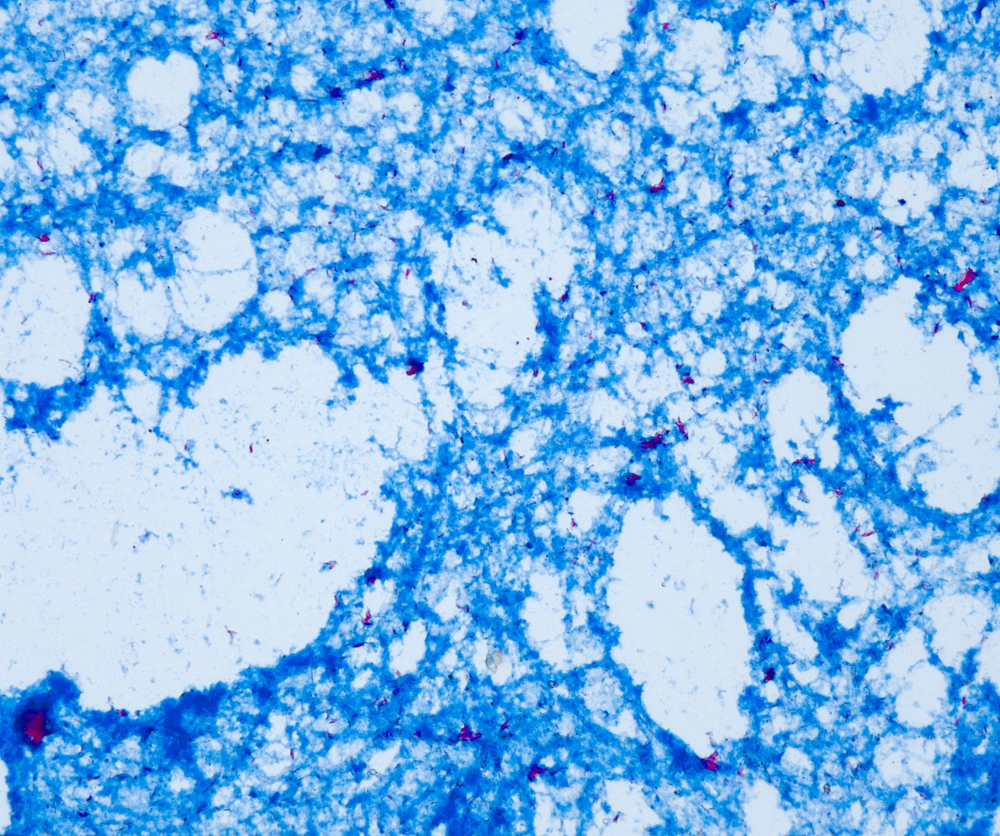

In [4]:
def random_split(df, val_size):
    """helper function to split training and test sets"""
    n = len(df)
    # generates random indices to select samples for the test set
    idxs = np.random.randint(0, n, size=val_size)
    # test set will be consisted of the samples with random indices
    test_df = df.iloc[idxs].copy().reset_index(drop=True)
    # train set will be total - test set
    train_df = df.drop(index=idxs).reset_index(drop=True)

    return train_df, test_df

# Random split with validation set(test set) size of 1000
train_df, test_df = random_split(tb_labels_df, 1000)

# inspect image
def get_image(idx, df, numpy=False, to_float=False):
    """helper function to fetch image from disk"""
    # image path is already stored in the data frame on the column "file_path"
    path = df.loc[idx, "file_path"]
    # ensures that the function doesn't attempt to open a non-existent file.
    assert os.path.exists(path)

    img = Image.open(path)
    # if numpy is true convert the PIL image to a NumPy array
    if numpy:
        arr = np.asarray(img)
        # if to_float is true normalize the pixel values of the array to the range [0, 1]
        if to_float:
            arr = arr / 255.0
        return arr
    else:
        return img


img = get_image(5, train_df)
img

In [5]:
# compute means and stds for normalization

means = []
stds = []

# loop through the first 1000 images (to be changed)
for idx in range(1000):
    # fetch the image as numpy array and normalize pixel values to the range [0, 1]
    arr = get_image(idx, train_df, numpy=True, to_float=True)
    # For each image array compute the mean and std of pixel values along the height and width dimensions.
    means.append(arr.mean(axis=(0, 1)))
    stds.append(arr.std(axis=(0, 1)))

# After iterating through all the images, get the mean of the mean and std values across the entire batch
MEANS = np.vstack(means).mean(axis=0)
STDS = np.vstack(stds).mean(axis=0)

print(MEANS, STDS)

[0.7607894  0.84840238 0.9358407 ] [0.11184855 0.07861234 0.04587845]


In [11]:
# Create Dataset
# a. implement __len__
# b. implement __getitem__
# c. return *single tuple* of (image, label)

class tbDataset(Dataset):
    """Implements two functions: __len__ and __getitem__"""

    # initialize the dataset object
    def __init__(self, df, transform=None, train=True):
        self.df = df
        self.transform = transform
        self.train = train

        # if train is true, it shuffles the Dataframe to ensure randomness during training
        if self.train:
            self.train = self.df.sample(frac=1.0, ignore_index=True)

    # to return the total number of samples in the dataset
    def __len__(self):
        return len(self.df)

    # to fetch an individual sample from the dataset
    def __getitem__(self, idx):
        # get image and label (tb_positive or not)
        img = get_image(idx, self.df, numpy=True, to_float=True)
        label = int(self.df.loc[idx, "tb_positive"])

        # if transform is provided, apply the transformation
        if self.transform:
            img = self.transform(img)

        return img, label

In [12]:
# Create DataLoaders in Lightning DataModule class:
# 1. train_dataloader returns DataLoader for training dataset
# 2. test_dataloader returns DataLoader for test dataset
# 3. Image transformation happens at the DataLoader level, but called within Dataset (inherited from torch.Dataset)


class tbDataModule(pl.LightningDataModule):
    """Returns training and test data from datasets in batches of given size"""
    
    # adjust batch size and num_workers?
    def __init__(self, df, batch_size=128, num_workers=8):
        super().__init__()
        self.full_df = df
        self.batch_size = batch_size
        self.num_workers = num_workers

        # transformations: cast to Tensor, Resize, Normalize with MEANS and STDS calculated previously
        # For Resizing, used 224*224 since Resnet was trained on images of size 224*224
        self.transform = transforms.Compose(
            [
                transforms.ToTensor(),
                transforms.Resize((224, 224), antialias=True),
                transforms.Normalize(MEANS, STDS),
            ]
        )

        self.setup()

    # split the full dataset into training and testing subsets
    def setup(self, stage=None):
        if stage == "train" or stage == None:
            self.train_df, self.test_df = random_split(self.full_df, 1000)
        else:
            pass

    # returns a DataLoader object for the training dataset
    def train_dataloader(self):
        return DataLoader(
            tbDataset(self.train_df, transform=self.transform),
            batch_size=self.batch_size,
            num_workers=self.num_workers,
        )

    # returns a DataLoader object for the testing dataset
    def test_dataloader(self):
        return DataLoader(
            tbDataset(self.test_df, transform=self.transform),
            batch_size=self.batch_size,
            num_workers=self.num_workers,
        )

In [13]:
# create LightningModule that defines network architecture:
# forward, training_step, test_step, configure_optimizer methods


class tbModel(pl.LightningModule):
    """Defines deep learning model (resnet) and implements forward,
    training_step, test_step, and configure_optimizers"""

    # initializes the model object with learning rate and number of classes
    def __init__(self, learning_rate=1e-3, num_classes=2):
        super().__init__()

        self.lr = learning_rate
        self.num_classes = num_classes

        # use ResNet-18 Model with weights initialized randomly
        self.net = resnet18(weights=None, num_classes=self.num_classes)
        # cast to double precision
        self.net.double()

        self.test_accuracy = Accuracy(task="binary", num_classes=self.num_classes)

    # Forward pass of model (takes an input tensor X and passes it through the ResNet model, returning the output)
    def forward(self, X):
        return self.net.forward(X)

    # defines the training logic for a single batch
    def training_step(self, batch, batch_idx):
        
        # extract images and labels from the batch
        imgs, labels = batch
        # computes the logits (raw predictions) by passing the images through the model 
        logits = self.net.forward(imgs)
        # computes the cross-entropy loss between the logits and the labels 
        loss = nn.functional.cross_entropy(logits, labels)

        # logs the training loss
        self.log("train_loss", loss)

        return loss

    # defines the testing/validation logic for a single batch
    def test_step(self, batch, batch_idx):
        imgs, labels = batch
        logits = self.net.forward(imgs)
        # use negative log-likelihood loss for computing the loss
        loss = nn.functional.nll_loss(logits, labels)

        # computes predictions by taking the argmax of the logits along the class dimension.
        preds = torch.argmax(logits, dim=-1)
        # updates the test accuracy
        self.test_accuracy.update(preds, labels)
        # logs the test accuracy
        self.log("test_acc", self.test_accuracy, prog_bar=True)

    # configures the optimizer used for training
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer

In [14]:
# Train Model
# Pytorch Lightning saves logs and parameters in specified directory

data = tbDataModule(tb_labels_df)
model = tbModel()
logger = pl.loggers.CSVLogger(save_dir=LOGGER_DIR, name="tb_demo")

# note: change max steps and epochs! (step = 1 step of gradient descent, i.e. one batch)
# accelerator="auto" will utilize a gpu if it is available
trainer = pl.Trainer(
    accelerator="auto",
    max_epochs=10, 
    logger=logger
)

# train model on training data
trainer.fit(model, data)

# test model on test data
trainer.test(model, data)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type           | Params
-------------------------------------------------
0 | net           | ResNet         | 11.2 M
1 | test_accuracy | BinaryAccuracy | 0     
-------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.710    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9470000267028809
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_acc': 0.9470000267028809}]